# Variational Autoencoders

## Set up


In [1]:
!pip install ipython-autotime
%load_ext autotime

!pip install image-similarity-measures
!pip install piq

!pip install keras-tuner -q

!git clone https://github.com/thelydie/FaceSketchSynthesis.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 34.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.1/20.1 MB 18.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 27.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for phasepack: filename=phasepack-1.5-py3-none-any.whl size=26984 sha256=1887a6cfdf871538e35d95ba69bdd9ecc0b3aaa0f8e098256e2bb7dd943844a9
  Stored in directory: /root/.cache/pip/wheels/a0/cd/22/acdeec70f562ae574ad93d9b3254922dddc630e987f6e3c4ff
Successfully built phasepack
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.5/139.5 KB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.3/16

In [2]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
from keras import layers, Model, backend
from keras.optimizers import Adam

from FaceSketchSynthesis import base_models, similarity, preparation

time: 11.7 s (started: 2023-03-09 17:45:13 +00:00)


## Constants

In [3]:
from FaceSketchSynthesis import base_models

TARGET_SIZE = 128,128
IMG_DIM = *TARGET_SIZE,3

MODELS_PATH='/content/drive/MyDrive/ML Models/'


time: 979 µs (started: 2023-03-09 17:45:24 +00:00)


In [4]:
class ModelVizCallback(keras.callbacks.Callback):
    """Callback to display a number of generated outputs"""
    def __init__(self, model, inputs, outputs, target_size, display_count=5, freq=1, **kwargs):
        super(ModelVizCallback, self).__init__(**kwargs)
        self.inputs = inputs[:display_count]
        self.outputs = outputs[:display_count]
        self.model = model
        self.display_count = display_count
        self.target_size = target_size
        self.freq = freq

    def on_epoch_end(self, epoch,logs=None):
        if epoch % self.freq == 0:
            predictions = self.model.predict(self.inputs)
            preparation.plot_synthesis(self.inputs, predictions, self.outputs, self.target_size, n=self.display_count)    

time: 5.62 ms (started: 2023-03-09 17:45:24 +00:00)


## Data

We use the CUHK (with 188 samples) provided by the CUFS. This dataset is comprised of 188 photo-sketch pairs. Each photo is in frontal position with neutral lighting, and the images are cropped to only include the relevant aspects of the picture. We use 150 samples for training and the rest for testing.
Our experiments are gender-agnostics, that is they do not distinguish between male and female faces. 

In our pre-processing, we resize the images to give them a dimension of 128x128 pixels, and we normalise their values to avoid large differences in variance and facilitate training.

Image target size: (128, 128)
Image dimensions: (128, 128, 3)
Training size: 169
Test size: 19


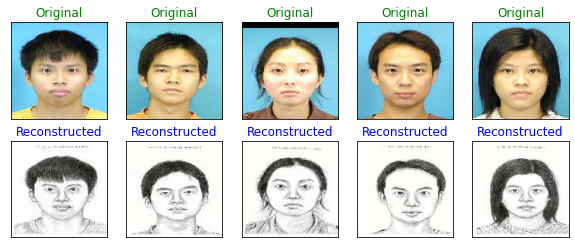

time: 2.23 s (started: 2023-03-09 17:45:24 +00:00)


In [5]:
from sklearn.model_selection import train_test_split

print('Image target size:', TARGET_SIZE)
print('Image dimensions:', IMG_DIM)


CUHK_DATASET = '/content/FaceSketchSynthesis/datasets/cuhk_dataset'

cuhk_photo_train = preparation.load_dataset(CUHK_DATASET+'/photos_train', TARGET_SIZE)
cuhk_sketch_train = preparation.load_dataset(CUHK_DATASET+'/sketches_train', TARGET_SIZE)
cuhk_photo_test = preparation.load_dataset(CUHK_DATASET+'/photos_test', TARGET_SIZE)
cuhk_sketch_test = preparation.load_dataset(CUHK_DATASET+'/sketches_test', TARGET_SIZE)

# cuhk_photos = preparation.load_dataset(CUHK_DATASET+'/photos', TARGET_SIZE)
# cuhk_sketches = preparation.load_dataset(CUHK_DATASET+'/sketches', TARGET_SIZE)

# cuhk_photo_train, cuhk_photo_test, cuhk_sketch_train, cuhk_sketch_test = train_test_split(
#     cuhk_photos, cuhk_sketches, test_size=0.10, shuffle=True)


# print('\nDataset size is', cuhk_photos.shape)
train_size = cuhk_photo_train.shape[0]
test_size = cuhk_photo_test.shape[0]
print('Training size:', train_size)
print('Test size:', test_size)

preparation.plot_side_by_side(cuhk_photo_test, cuhk_sketch_test, TARGET_SIZE, n=5)

In [6]:
import os

# Name template: img-01-model
def create_image_filename(img_no, model_name):
    # Names include: photo, ae-mse, ae-ssim, vae-mse, vae-ssim, wtae, 
    return f'img-{img_no :03d}-{model_name}.jpg'

EVALUATION_IMG_DIR = '/content/drive/MyDrive/evaluation_results/'

def save_images(images, model_name, dir=EVALUATION_IMG_DIR):
    n = len(images)
    for i in range(n):
        img_array = images[i]
        filepath = os.path.join(dir, create_image_filename(i+1, model_name))
        keras.preprocessing.image.save_img(filepath, img_array)

# save_images(cuhk_photo_train[:1], EVALUATION_IMG_DIR, 'test')

time: 5.2 ms (started: 2023-03-09 17:45:27 +00:00)


# Variational Autoencoder Architecture

Let us begin with a simple architecture for the VAE

In [7]:
def get_autoencoder(model_name='vae', reparametrized=False):    
    encoder = keras.Sequential([
        layers.Input(IMG_DIM, name='input_image'),
        layers.Convolution2D(64, 3, strides = 2, padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.3),
        layers.Convolution2D(64, 3, strides = 2, padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.3),
        layers.Convolution2D(64, 3, strides = 1, padding='same'),
        layers.Flatten(),    
    ])
    # encoder.summary()

    latent_dim = 256
    if reparametrized:
        input_img = layers.Input(IMG_DIM, name='input_image')
        x = encoder(input_img)
        z_mean = layers.Dense(latent_dim, name='distribution_mean')(x)
        z_log_var = layers.Dense(latent_dim, name='distribution_var')(x)
        latent_inputs = base_models.Sampling(name='latent_samples')([z_mean, z_log_var])
        encoder = Model(input_img, [latent_inputs, z_mean, z_log_var])

    decoder = keras.Sequential([
        layers.Input((latent_dim,), name='latent_code'),
        layers.Dense(32*32*16),
        layers.Reshape((16,16,64)),
        layers.UpSampling2D(2, interpolation='bicubic'),
        layers.Convolution2D(32, 3, strides = 1, padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.2),
        layers.UpSampling2D(2, interpolation='bicubic'),
        layers.Convolution2D(32, 3, strides = 1, padding='same'),
        layers.BatchNormalization(),
        layers.UpSampling2D(2, interpolation='bicubic'),
        layers.Convolution2D(32, 3, strides = 1, padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.2),
        layers.Convolution2D(3, 3, strides=1, padding='same', activation='sigmoid')
    ])
    # decoder.summary()

    return base_models.VariationalAutoencoder(
        encoder, decoder, latent_dim, reparametrized=reparametrized, name=model_name
    )

time: 11.1 ms (started: 2023-03-09 17:45:27 +00:00)


In [ ]:
vae = get_autoencoder()
vae.encoder.summary()
vae.decoder.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 64)        1792      
                                                                 
 batch_normalization (BatchN  (None, 64, 64, 64)       256       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64, 64, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        36928     
                                                                 
 batch_normalization_1 (Batc  (None, 32, 32, 64)       256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 32, 32, 64)        0

# Variational Autoencoders with a MSE loss



## Model Training

Epoch 1/100
1/1 [==============================] - 1s 1s/step


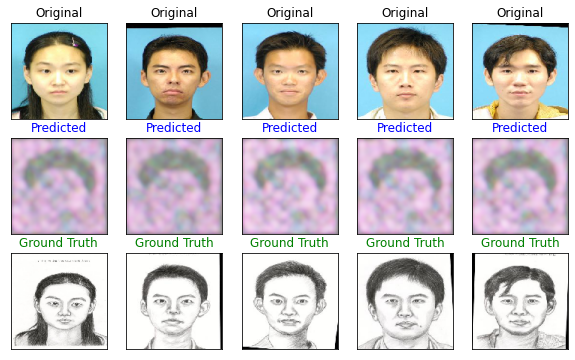

5/5 [==============================] - 61s 11s/step - loss: 21.6012 - reconstruction_loss: 0.1543 - kl_loss: 24.2474 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 2/100
5/5 [==============================] - 21s 4s/step - loss: 3.8431 - reconstruction_loss: 0.0900 - kl_loss: 3.8166 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 3/100
5/5 [==============================] - 22s 4s/step - loss: 3.5509 - reconstruction_loss: 0.0896 - kl_loss: 3.0934 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 4/100
5/5 [==============================] - 21s 4s/step - loss: 1.6703 - reconstruction_loss: 0.0781 - kl_loss: 1.2099 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 5/100
5/5 [==============================] - 21s 4s/step - loss: 1.2119 - reconstruction_loss: 0.0744 - kl_loss: 0.6083 - val_t

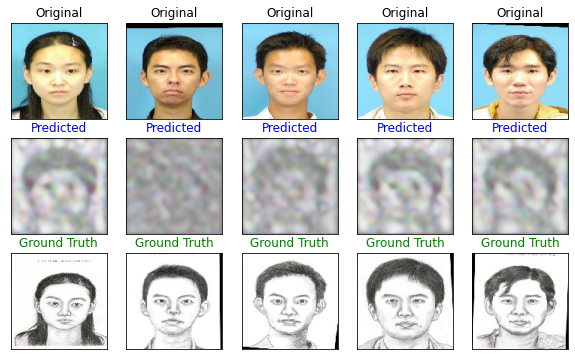

5/5 [==============================] - 26s 5s/step - loss: 1.3485 - reconstruction_loss: 0.0619 - kl_loss: 0.5553 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 7/100
5/5 [==============================] - 24s 5s/step - loss: 1.0136 - reconstruction_loss: 0.0708 - kl_loss: 0.3277 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 8/100
5/5 [==============================] - 21s 4s/step - loss: 0.9421 - reconstruction_loss: 0.0784 - kl_loss: 0.1564 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 9/100
5/5 [==============================] - 20s 4s/step - loss: 0.9244 - reconstruction_loss: 0.0679 - kl_loss: 0.2812 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 10/100
5/5 [==============================] - 22s 4s/step - loss: 0.7723 - reconstruction_loss: 0.0610 - kl_loss: 0.1719 - val_tot

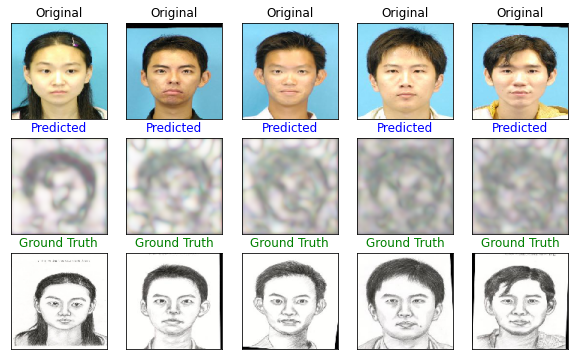

5/5 [==============================] - 21s 4s/step - loss: 1.2958 - reconstruction_loss: 0.0656 - kl_loss: 0.5916 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 12/100
5/5 [==============================] - 21s 4s/step - loss: 0.8775 - reconstruction_loss: 0.0587 - kl_loss: 0.2891 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 13/100
5/5 [==============================] - 21s 4s/step - loss: 0.7593 - reconstruction_loss: 0.0576 - kl_loss: 0.1491 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 14/100
5/5 [==============================] - 20s 4s/step - loss: 0.6149 - reconstruction_loss: 0.0515 - kl_loss: 0.1031 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 15/100
5/5 [==============================] - 28s 6s/step - loss: 0.5852 - reconstruction_loss: 0.0538 - kl_loss: 0.0452 - val_

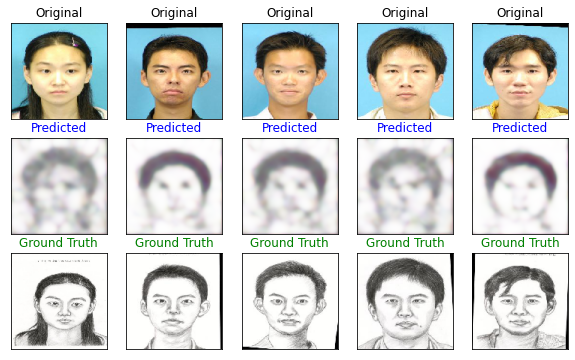

5/5 [==============================] - 22s 5s/step - loss: 0.5579 - reconstruction_loss: 0.0514 - kl_loss: 0.0489 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 17/100
5/5 [==============================] - 22s 4s/step - loss: 0.5291 - reconstruction_loss: 0.0527 - kl_loss: 0.0317 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 18/100
5/5 [==============================] - 20s 4s/step - loss: 0.5511 - reconstruction_loss: 0.0504 - kl_loss: 0.0330 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 19/100
5/5 [==============================] - 24s 5s/step - loss: 0.5345 - reconstruction_loss: 0.0497 - kl_loss: 0.0276 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 20/100
5/5 [==============================] - 22s 4s/step - loss: 0.5300 - reconstruction_loss: 0.0485 - kl_loss: 0.0372 - val_

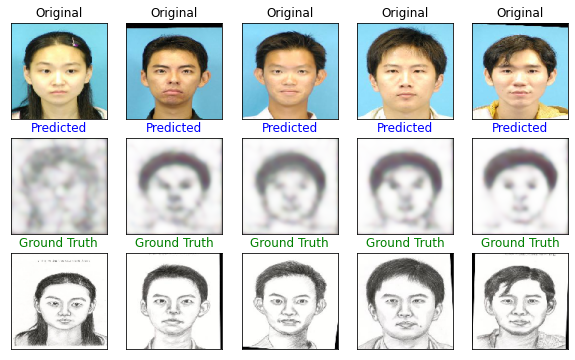

5/5 [==============================] - 24s 5s/step - loss: 0.5038 - reconstruction_loss: 0.0478 - kl_loss: 0.0292 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 22/100
5/5 [==============================] - 23s 5s/step - loss: 0.5057 - reconstruction_loss: 0.0472 - kl_loss: 0.0329 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 23/100
5/5 [==============================] - 23s 4s/step - loss: 0.4912 - reconstruction_loss: 0.0456 - kl_loss: 0.0338 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 24/100
5/5 [==============================] - 20s 4s/step - loss: 0.4875 - reconstruction_loss: 0.0448 - kl_loss: 0.0365 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 25/100
5/5 [==============================] - 21s 4s/step - loss: 0.4722 - reconstruction_loss: 0.0439 - kl_loss: 0.0405 - val_

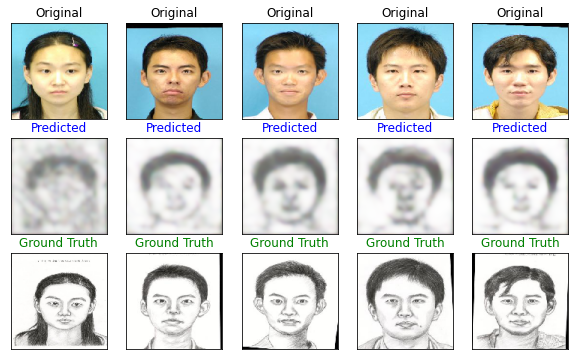

5/5 [==============================] - 22s 4s/step - loss: 0.4825 - reconstruction_loss: 0.0431 - kl_loss: 0.0401 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 27/100
5/5 [==============================] - 20s 4s/step - loss: 0.4739 - reconstruction_loss: 0.0432 - kl_loss: 0.0375 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 28/100
5/5 [==============================] - 22s 4s/step - loss: 0.4794 - reconstruction_loss: 0.0437 - kl_loss: 0.0429 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 29/100
5/5 [==============================] - 20s 4s/step - loss: 0.4566 - reconstruction_loss: 0.0418 - kl_loss: 0.0390 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 30/100
5/5 [==============================] - 25s 5s/step - loss: 0.4639 - reconstruction_loss: 0.0414 - kl_loss: 0.0395 - val_

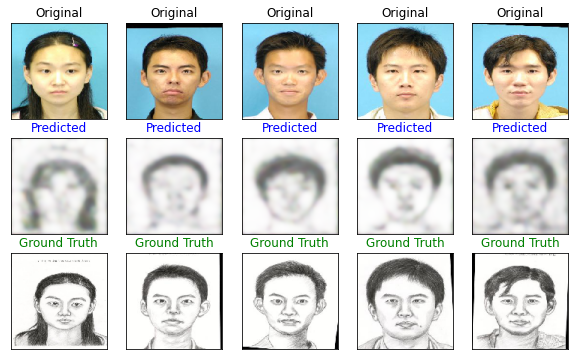

5/5 [==============================] - 21s 4s/step - loss: 0.4878 - reconstruction_loss: 0.0413 - kl_loss: 0.0452 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 32/100
5/5 [==============================] - 21s 4s/step - loss: 0.4502 - reconstruction_loss: 0.0407 - kl_loss: 0.0409 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 33/100
5/5 [==============================] - 22s 4s/step - loss: 0.4514 - reconstruction_loss: 0.0404 - kl_loss: 0.0504 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 34/100
5/5 [==============================] - 20s 4s/step - loss: 0.4419 - reconstruction_loss: 0.0398 - kl_loss: 0.0495 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 35/100
5/5 [==============================] - 22s 4s/step - loss: 0.4601 - reconstruction_loss: 0.0417 - kl_loss: 0.0463 - val_

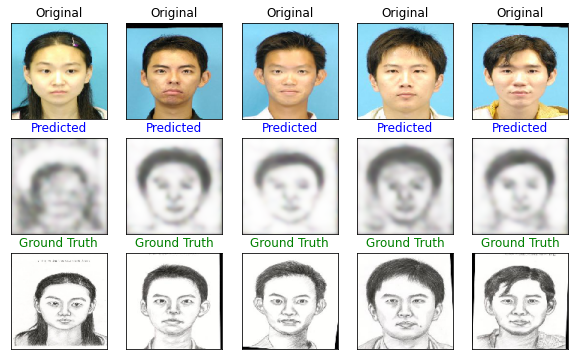

5/5 [==============================] - 21s 4s/step - loss: 0.4593 - reconstruction_loss: 0.0394 - kl_loss: 0.0522 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 37/100
5/5 [==============================] - 23s 5s/step - loss: 0.4367 - reconstruction_loss: 0.0382 - kl_loss: 0.0491 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 38/100
5/5 [==============================] - 23s 4s/step - loss: 0.4063 - reconstruction_loss: 0.0373 - kl_loss: 0.0471 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 39/100
5/5 [==============================] - 21s 4s/step - loss: 0.4525 - reconstruction_loss: 0.0390 - kl_loss: 0.0496 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 40/100
5/5 [==============================] - 22s 4s/step - loss: 0.4176 - reconstruction_loss: 0.0377 - kl_loss: 0.0497 - val_

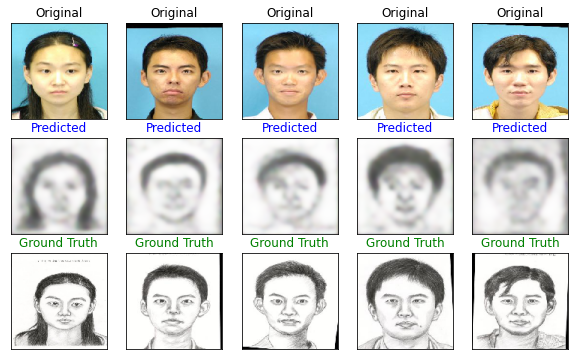

5/5 [==============================] - 21s 4s/step - loss: 0.4295 - reconstruction_loss: 0.0374 - kl_loss: 0.0519 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 42/100
5/5 [==============================] - 23s 4s/step - loss: 0.4102 - reconstruction_loss: 0.0373 - kl_loss: 0.0462 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 43/100
5/5 [==============================] - 20s 4s/step - loss: 0.4111 - reconstruction_loss: 0.0362 - kl_loss: 0.0481 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 44/100
5/5 [==============================] - 21s 4s/step - loss: 0.4144 - reconstruction_loss: 0.0362 - kl_loss: 0.0530 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 45/100
5/5 [==============================] - 25s 5s/step - loss: 0.3951 - reconstruction_loss: 0.0357 - kl_loss: 0.0497 - val_

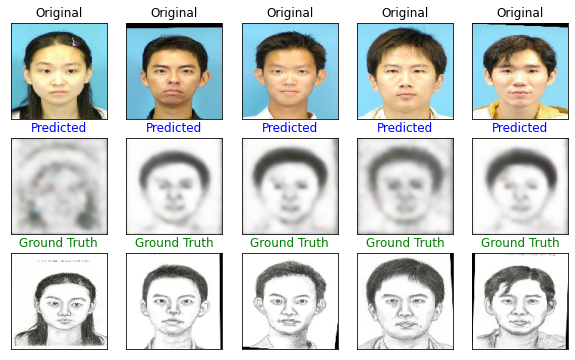

5/5 [==============================] - 22s 4s/step - loss: 0.3937 - reconstruction_loss: 0.0348 - kl_loss: 0.0535 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 47/100
5/5 [==============================] - 27s 5s/step - loss: 0.4061 - reconstruction_loss: 0.0353 - kl_loss: 0.0508 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 48/100
5/5 [==============================] - 21s 4s/step - loss: 0.4091 - reconstruction_loss: 0.0352 - kl_loss: 0.0550 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 49/100
5/5 [==============================] - 23s 5s/step - loss: 0.4112 - reconstruction_loss: 0.0354 - kl_loss: 0.0560 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 50/100
5/5 [==============================] - 21s 4s/step - loss: 0.4039 - reconstruction_loss: 0.0340 - kl_loss: 0.0544 - val_

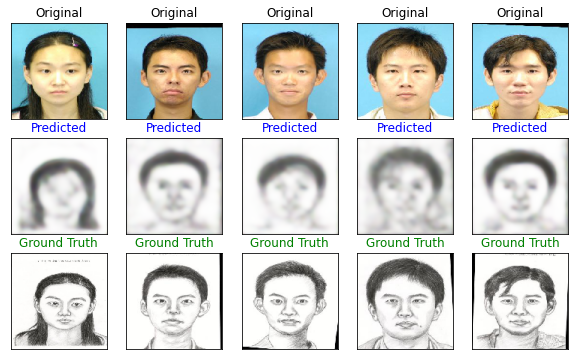

5/5 [==============================] - 23s 5s/step - loss: 0.3956 - reconstruction_loss: 0.0333 - kl_loss: 0.0525 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 52/100
5/5 [==============================] - 23s 5s/step - loss: 0.3859 - reconstruction_loss: 0.0337 - kl_loss: 0.0505 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 53/100
5/5 [==============================] - 22s 5s/step - loss: 0.3884 - reconstruction_loss: 0.0331 - kl_loss: 0.0522 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 54/100
5/5 [==============================] - 21s 4s/step - loss: 0.3802 - reconstruction_loss: 0.0336 - kl_loss: 0.0505 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 55/100
5/5 [==============================] - 21s 4s/step - loss: 0.3904 - reconstruction_loss: 0.0328 - kl_loss: 0.0571 - val_

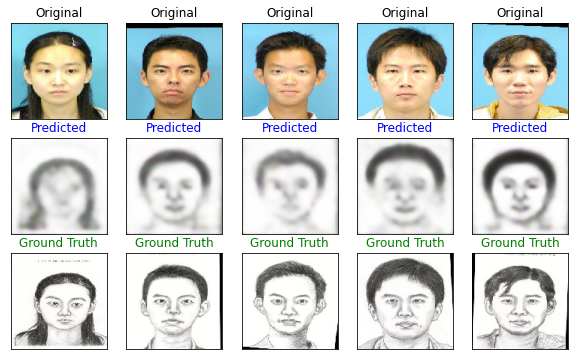

5/5 [==============================] - 24s 4s/step - loss: 0.3591 - reconstruction_loss: 0.0320 - kl_loss: 0.0505 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 57/100
5/5 [==============================] - 21s 4s/step - loss: 0.3765 - reconstruction_loss: 0.0318 - kl_loss: 0.0526 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 58/100
5/5 [==============================] - 23s 4s/step - loss: 0.3820 - reconstruction_loss: 0.0323 - kl_loss: 0.0573 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 59/100
5/5 [==============================] - 21s 4s/step - loss: 0.3807 - reconstruction_loss: 0.0333 - kl_loss: 0.0546 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 60/100
5/5 [==============================] - 24s 5s/step - loss: 0.3682 - reconstruction_loss: 0.0322 - kl_loss: 0.0599 - val_

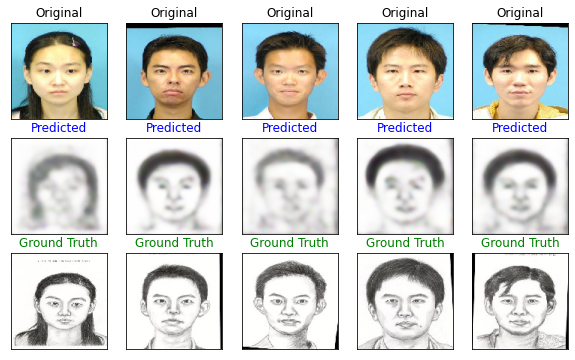

5/5 [==============================] - 23s 5s/step - loss: 0.3705 - reconstruction_loss: 0.0321 - kl_loss: 0.0541 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 62/100
5/5 [==============================] - 22s 4s/step - loss: 0.3755 - reconstruction_loss: 0.0317 - kl_loss: 0.0597 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 63/100
5/5 [==============================] - 22s 4s/step - loss: 0.3640 - reconstruction_loss: 0.0313 - kl_loss: 0.0552 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 64/100
5/5 [==============================] - 21s 4s/step - loss: 0.3695 - reconstruction_loss: 0.0313 - kl_loss: 0.0574 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 65/100
5/5 [==============================] - 23s 4s/step - loss: 0.3702 - reconstruction_loss: 0.0312 - kl_loss: 0.0587 - val_

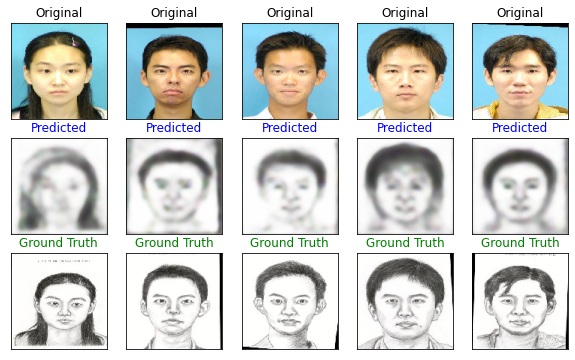

5/5 [==============================] - 21s 4s/step - loss: 0.3760 - reconstruction_loss: 0.0310 - kl_loss: 0.0584 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 67/100
5/5 [==============================] - 25s 5s/step - loss: 0.3661 - reconstruction_loss: 0.0305 - kl_loss: 0.0621 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 68/100
5/5 [==============================] - 20s 4s/step - loss: 0.3636 - reconstruction_loss: 0.0309 - kl_loss: 0.0588 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 69/100
5/5 [==============================] - 22s 4s/step - loss: 0.3601 - reconstruction_loss: 0.0300 - kl_loss: 0.0626 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 70/100
5/5 [==============================] - 22s 4s/step - loss: 0.3633 - reconstruction_loss: 0.0308 - kl_loss: 0.0608 - val_

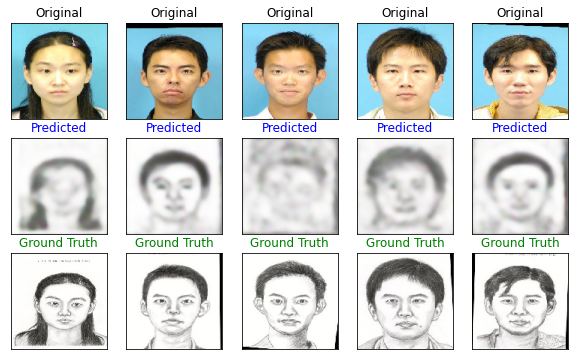

5/5 [==============================] - 22s 4s/step - loss: 0.3680 - reconstruction_loss: 0.0312 - kl_loss: 0.0576 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 72/100
5/5 [==============================] - 23s 4s/step - loss: 0.3559 - reconstruction_loss: 0.0298 - kl_loss: 0.0616 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 73/100
5/5 [==============================] - 21s 4s/step - loss: 0.3697 - reconstruction_loss: 0.0305 - kl_loss: 0.0590 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 74/100
5/5 [==============================] - 22s 4s/step - loss: 0.3533 - reconstruction_loss: 0.0289 - kl_loss: 0.0612 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 75/100
5/5 [==============================] - 30s 5s/step - loss: 0.3547 - reconstruction_loss: 0.0295 - kl_loss: 0.0634 - val_

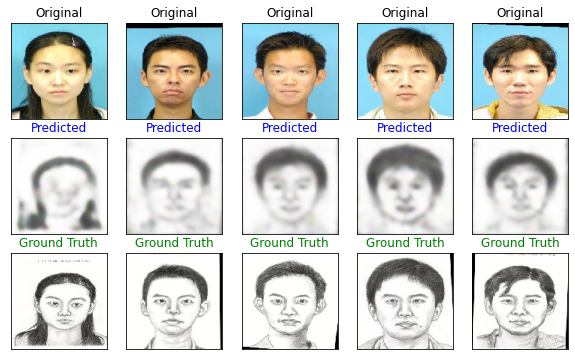

5/5 [==============================] - 23s 4s/step - loss: 0.3420 - reconstruction_loss: 0.0294 - kl_loss: 0.0608 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 77/100
5/5 [==============================] - 21s 4s/step - loss: 0.3424 - reconstruction_loss: 0.0282 - kl_loss: 0.0592 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 78/100
5/5 [==============================] - 23s 4s/step - loss: 0.3544 - reconstruction_loss: 0.0291 - kl_loss: 0.0634 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 79/100
5/5 [==============================] - 21s 4s/step - loss: 0.3428 - reconstruction_loss: 0.0289 - kl_loss: 0.0576 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 80/100
5/5 [==============================] - 23s 5s/step - loss: 0.3552 - reconstruction_loss: 0.0284 - kl_loss: 0.0614 - val_

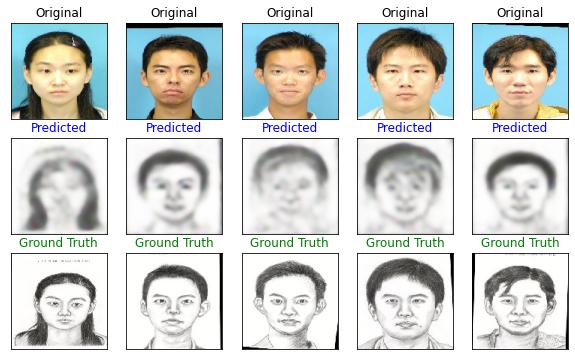

5/5 [==============================] - 22s 5s/step - loss: 0.3462 - reconstruction_loss: 0.0287 - kl_loss: 0.0618 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 82/100
5/5 [==============================] - 25s 5s/step - loss: 0.3452 - reconstruction_loss: 0.0289 - kl_loss: 0.0618 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 83/100
5/5 [==============================] - 21s 4s/step - loss: 0.3496 - reconstruction_loss: 0.0285 - kl_loss: 0.0650 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 84/100
5/5 [==============================] - 21s 4s/step - loss: 0.3381 - reconstruction_loss: 0.0276 - kl_loss: 0.0609 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 85/100
5/5 [==============================] - 23s 4s/step - loss: 0.3451 - reconstruction_loss: 0.0286 - kl_loss: 0.0600 - val_

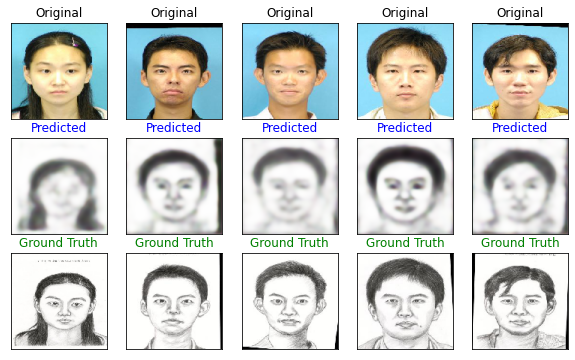

5/5 [==============================] - 22s 4s/step - loss: 0.3327 - reconstruction_loss: 0.0268 - kl_loss: 0.0618 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 87/100
5/5 [==============================] - 23s 4s/step - loss: 0.3449 - reconstruction_loss: 0.0287 - kl_loss: 0.0601 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 88/100
5/5 [==============================] - 21s 4s/step - loss: 0.3463 - reconstruction_loss: 0.0283 - kl_loss: 0.0626 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 89/100
5/5 [==============================] - 23s 5s/step - loss: 0.3476 - reconstruction_loss: 0.0279 - kl_loss: 0.0634 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 90/100
5/5 [==============================] - 22s 4s/step - loss: 0.3371 - reconstruction_loss: 0.0269 - kl_loss: 0.0657 - val_

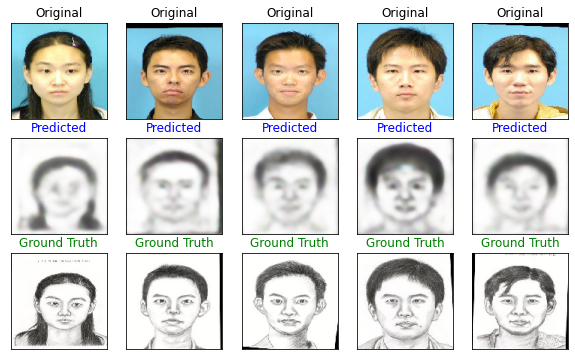

5/5 [==============================] - 22s 4s/step - loss: 0.3338 - reconstruction_loss: 0.0266 - kl_loss: 0.0678 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 92/100
5/5 [==============================] - 23s 4s/step - loss: 0.3340 - reconstruction_loss: 0.0272 - kl_loss: 0.0638 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 93/100
5/5 [==============================] - 21s 4s/step - loss: 0.3221 - reconstruction_loss: 0.0255 - kl_loss: 0.0620 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 94/100
5/5 [==============================] - 23s 4s/step - loss: 0.3237 - reconstruction_loss: 0.0258 - kl_loss: 0.0623 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 95/100
5/5 [==============================] - 21s 4s/step - loss: 0.3338 - reconstruction_loss: 0.0274 - kl_loss: 0.0617 - val_

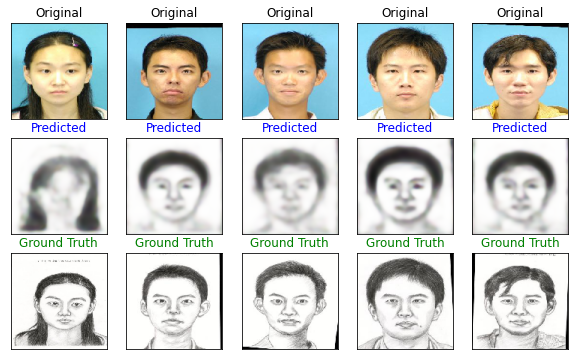

5/5 [==============================] - 23s 5s/step - loss: 0.3226 - reconstruction_loss: 0.0259 - kl_loss: 0.0640 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 97/100
5/5 [==============================] - 24s 5s/step - loss: 0.3433 - reconstruction_loss: 0.0276 - kl_loss: 0.0650 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 98/100
5/5 [==============================] - 21s 4s/step - loss: 0.3407 - reconstruction_loss: 0.0266 - kl_loss: 0.0656 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 99/100
5/5 [==============================] - 22s 4s/step - loss: 0.3398 - reconstruction_loss: 0.0267 - kl_loss: 0.0664 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 100/100
5/5 [==============================] - 21s 4s/step - loss: 0.3466 - reconstruction_loss: 0.0269 - kl_loss: 0.0718 - val

Text(0.5, 1.0, 'Loss over the epochs')

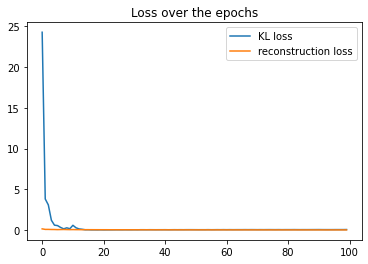

time: 38min 35s (started: 2023-03-08 23:06:38 +00:00)


In [ ]:
vae1 = get_autoencoder('vae_mse')

vae1.compile(kl_loss_factor=1, rec_loss_factor=10,
    optimizer=Adam(0.001, amsgrad=True),
    loss=keras.losses.mse
)

hist1 = vae1.fit(
    cuhk_photo_train, cuhk_sketch_train,
    epochs=100, batch_size=32,
    shuffle=True, validation_split=0.1,
    callbacks=[
        ModelVizCallback(vae1, cuhk_photo_train, cuhk_sketch_train, TARGET_SIZE, freq=5),
        ],
)

vae1.save(f'{MODELS_PATH}vae')


plt.plot(hist1.history["kl_loss"])
plt.plot(hist1.history["reconstruction_loss"])
plt.legend(['KL loss','reconstruction loss'], loc='upper right')
plt.title('Loss over the epochs')

# generated_sketches = vae1.predict(cuhk_photo_test)
# preparation.plot_synthesis(cuhk_photo_test, generated_sketches, cuhk_sketch_test, TARGET_SIZE)

## Model Evaluation

1/1 [==============================] - 1s 1s/step


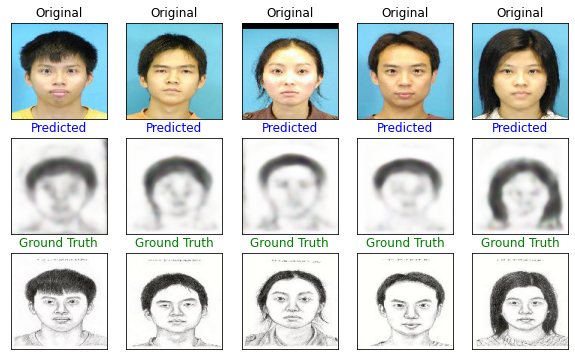

time: 12 s (started: 2023-03-09 15:51:12 +00:00)


In [10]:
vae1 = keras.models.load_model(f'{MODELS_PATH}vae')
generated_sketches = vae1.predict(cuhk_photo_test)
preparation.plot_synthesis(cuhk_photo_test, generated_sketches, cuhk_sketch_test, TARGET_SIZE)
save_images(generated_sketches, 'vae_mse')

/usr/local/lib/python3.9/dist-packages/image_similarity_measures/quality_metrics.py:197: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return structural_similarity(org_img, pred_img, data_range=max_p, multichannel=True)


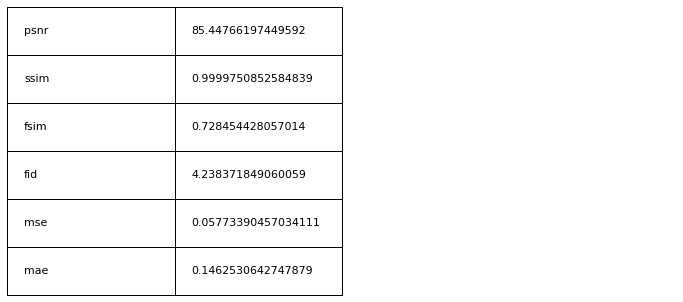

time: 12.2 s (started: 2023-03-08 23:52:10 +00:00)


In [ ]:
eval1 = similarity.Evaluator()
eval1.evaluate_batch_on_all(cuhk_sketch_test,generated_sketches)
preparation.plot_dict_as_table(eval1.results)

In [ ]:
vae1.save(f'{MODELS_PATH}vae_w_mse')

time: 8.14 s (started: 2023-03-08 14:07:44 +00:00)


# Variational Autoencoders with a SSIM loss

This version uses a simple architecture: the autoencoder from Model 1, and adds a latent space of size `l=256`.
The difference between this and `2.0` is that all convolution layers have the same number of filters (here, 32).

## Model Training

Epoch 1/150
1/1 [==============================] - 0s 363ms/step


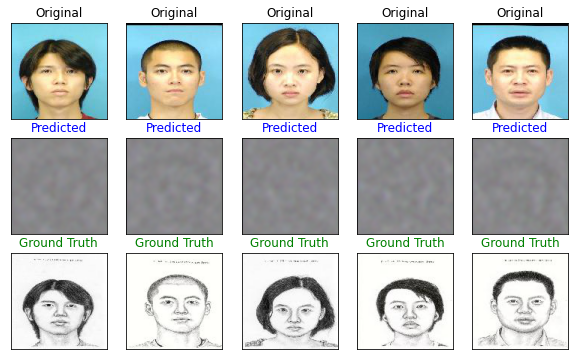

5/5 [==============================] - 61s 11s/step - loss: 6.8197 - reconstruction_loss: 0.6702 - kl_loss: 0.0285 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 2/150
5/5 [==============================] - ETA: 0s - loss: 6.4554 - reconstruction_loss: 0.6331 - kl_loss: 0.1162 

5/5 [==============================] - 59s 13s/step - loss: 6.4443 - reconstruction_loss: 0.6331 - kl_loss: 0.1162 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 3/150
5/5 [==============================] - ETA: 0s - loss: 6.1483 - reconstruction_loss: 0.5982 - kl_loss: 0.1664

5/5 [==============================] - 56s 11s/step - loss: 6.1345 - reconstruction_loss: 0.5982 - kl_loss: 0.1664 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 4/150
5/5 [==============================] - ETA: 0s - loss: 5.8033 - reconstruction_loss: 0.5693 - kl_loss: 0.1566

5/5 [==============================] - 56s 12s/step - loss: 5.7980 - reconstruction_loss: 0.5693 - kl_loss: 0.1566 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 5/150
5/5 [==============================] - ETA: 0s - loss: 5.6975 - reconstruction_loss: 0.5661 - kl_loss: 0.0829

5/5 [==============================] - 51s 11s/step - loss: 5.6983 - reconstruction_loss: 0.5661 - kl_loss: 0.0829 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 6/150
1/1 [==============================] - 0s 180ms/step


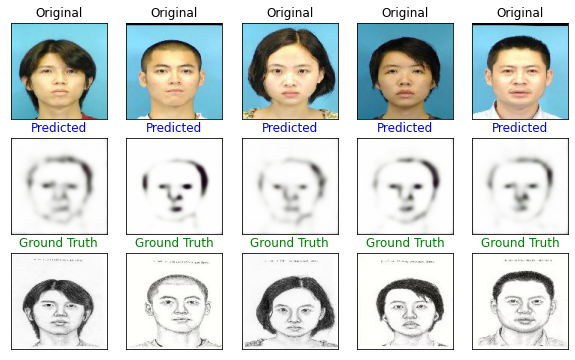

5/5 [==============================] - 53s 11s/step - loss: 5.6547 - reconstruction_loss: 0.5649 - kl_loss: 0.0532 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 7/150
5/5 [==============================] - ETA: 0s - loss: 5.6747 - reconstruction_loss: 0.5605 - kl_loss: 0.0551

5/5 [==============================] - 51s 11s/step - loss: 5.6676 - reconstruction_loss: 0.5605 - kl_loss: 0.0551 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 8/150
5/5 [==============================] - ETA: 0s - loss: 5.6702 - reconstruction_loss: 0.5553 - kl_loss: 0.0901

5/5 [==============================] - 55s 11s/step - loss: 5.6582 - reconstruction_loss: 0.5553 - kl_loss: 0.0901 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 9/150
5/5 [==============================] - ETA: 0s - loss: 5.6051 - reconstruction_loss: 0.5508 - kl_loss: 0.0971

5/5 [==============================] - 52s 11s/step - loss: 5.5970 - reconstruction_loss: 0.5508 - kl_loss: 0.0971 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 10/150
5/5 [==============================] - ETA: 0s - loss: 5.4863 - reconstruction_loss: 0.5487 - kl_loss: 0.0758

5/5 [==============================] - 52s 11s/step - loss: 5.4927 - reconstruction_loss: 0.5487 - kl_loss: 0.0758 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 11/150
1/1 [==============================] - 0s 299ms/step


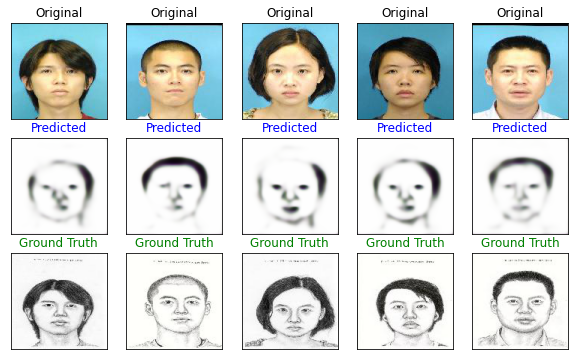

5/5 [==============================] - 51s 11s/step - loss: 5.4537 - reconstruction_loss: 0.5418 - kl_loss: 0.1278 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 12/150
5/5 [==============================] - ETA: 0s - loss: 5.3912 - reconstruction_loss: 0.5287 - kl_loss: 0.1573

5/5 [==============================] - 56s 12s/step - loss: 5.3869 - reconstruction_loss: 0.5287 - kl_loss: 0.1573 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 13/150
5/5 [==============================] - ETA: 0s - loss: 5.2419 - reconstruction_loss: 0.5223 - kl_loss: 0.1583 

5/5 [==============================] - 58s 12s/step - loss: 5.2520 - reconstruction_loss: 0.5223 - kl_loss: 0.1583 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 14/150
5/5 [==============================] - ETA: 0s - loss: 5.3253 - reconstruction_loss: 0.5219 - kl_loss: 0.1902

5/5 [==============================] - 54s 11s/step - loss: 5.3234 - reconstruction_loss: 0.5219 - kl_loss: 0.1902 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 15/150
5/5 [==============================] - ETA: 0s - loss: 5.2243 - reconstruction_loss: 0.5124 - kl_loss: 0.1627

5/5 [==============================] - 53s 11s/step - loss: 5.2211 - reconstruction_loss: 0.5124 - kl_loss: 0.1627 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 16/150
1/1 [==============================] - 0s 154ms/step


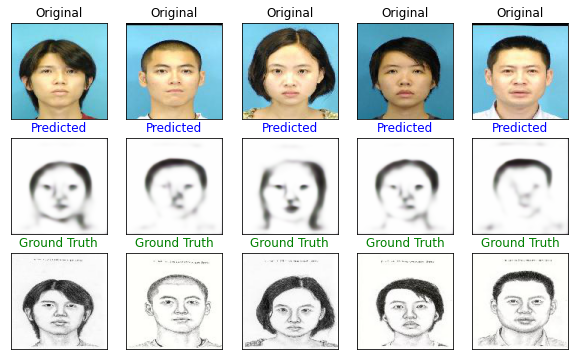

5/5 [==============================] - 55s 11s/step - loss: 5.0988 - reconstruction_loss: 0.5052 - kl_loss: 0.1691 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 17/150
5/5 [==============================] - ETA: 0s - loss: 5.1052 - reconstruction_loss: 0.4999 - kl_loss: 0.2044

5/5 [==============================] - 51s 11s/step - loss: 5.1046 - reconstruction_loss: 0.4999 - kl_loss: 0.2044 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 18/150
5/5 [==============================] - ETA: 0s - loss: 5.0768 - reconstruction_loss: 0.4952 - kl_loss: 0.2447

5/5 [==============================] - 51s 10s/step - loss: 5.0763 - reconstruction_loss: 0.4952 - kl_loss: 0.2447 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 19/150
5/5 [==============================] - ETA: 0s - loss: 4.9254 - reconstruction_loss: 0.4800 - kl_loss: 0.2084

5/5 [==============================] - 55s 12s/step - loss: 4.9219 - reconstruction_loss: 0.4800 - kl_loss: 0.2084 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 20/150
5/5 [==============================] - ETA: 0s - loss: 4.9513 - reconstruction_loss: 0.4754 - kl_loss: 0.2594

5/5 [==============================] - 54s 11s/step - loss: 4.9400 - reconstruction_loss: 0.4754 - kl_loss: 0.2594 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 21/150
1/1 [==============================] - 0s 168ms/step


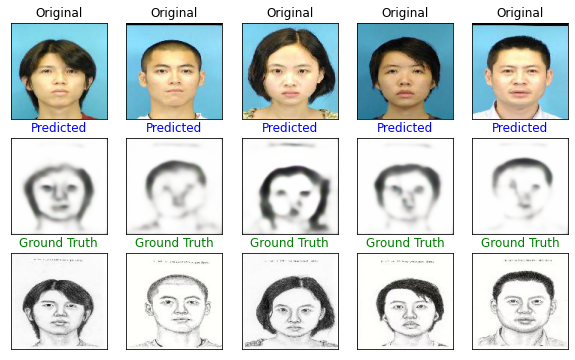

5/5 [==============================] - 54s 12s/step - loss: 4.8190 - reconstruction_loss: 0.4670 - kl_loss: 0.2704 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 22/150
5/5 [==============================] - ETA: 0s - loss: 4.7614 - reconstruction_loss: 0.4687 - kl_loss: 0.2907

5/5 [==============================] - 53s 11s/step - loss: 4.7733 - reconstruction_loss: 0.4687 - kl_loss: 0.2907 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 23/150
5/5 [==============================] - ETA: 0s - loss: 4.6949 - reconstruction_loss: 0.4550 - kl_loss: 0.3000

5/5 [==============================] - 54s 10s/step - loss: 4.6957 - reconstruction_loss: 0.4550 - kl_loss: 0.3000 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 24/150
5/5 [==============================] - ETA: 0s - loss: 4.5777 - reconstruction_loss: 0.4411 - kl_loss: 0.3559

5/5 [==============================] - 59s 12s/step - loss: 4.5796 - reconstruction_loss: 0.4411 - kl_loss: 0.3559 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 25/150
5/5 [==============================] - ETA: 0s - loss: 4.5103 - reconstruction_loss: 0.4354 - kl_loss: 0.3462

5/5 [==============================] - 52s 11s/step - loss: 4.5132 - reconstruction_loss: 0.4354 - kl_loss: 0.3462 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 26/150
1/1 [==============================] - 0s 170ms/step


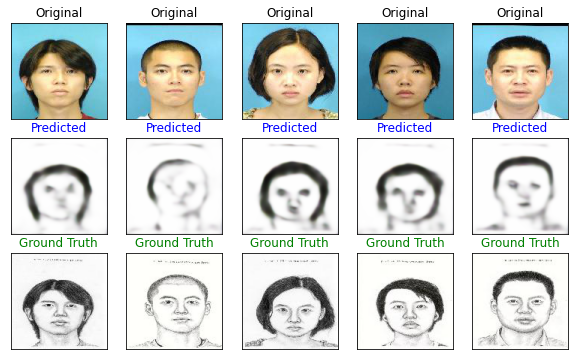

5/5 [==============================] - 57s 12s/step - loss: 4.4406 - reconstruction_loss: 0.4346 - kl_loss: 0.3369 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 27/150
5/5 [==============================] - ETA: 0s - loss: 4.3793 - reconstruction_loss: 0.4209 - kl_loss: 0.3851

5/5 [==============================] - 52s 11s/step - loss: 4.3830 - reconstruction_loss: 0.4209 - kl_loss: 0.3851 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 28/150
5/5 [==============================] - ETA: 0s - loss: 4.3998 - reconstruction_loss: 0.4147 - kl_loss: 0.4234

5/5 [==============================] - 52s 11s/step - loss: 4.3930 - reconstruction_loss: 0.4147 - kl_loss: 0.4234 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 29/150
5/5 [==============================] - ETA: 0s - loss: 4.2985 - reconstruction_loss: 0.4109 - kl_loss: 0.4327

5/5 [==============================] - 50s 10s/step - loss: 4.3029 - reconstruction_loss: 0.4109 - kl_loss: 0.4327 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 30/150
5/5 [==============================] - ETA: 0s - loss: 4.2447 - reconstruction_loss: 0.4091 - kl_loss: 0.4012

5/5 [==============================] - 56s 11s/step - loss: 4.2525 - reconstruction_loss: 0.4091 - kl_loss: 0.4012 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 31/150
1/1 [==============================] - 0s 164ms/step


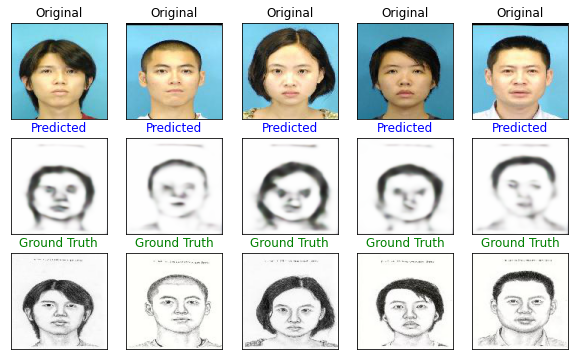

5/5 [==============================] - 54s 11s/step - loss: 4.1931 - reconstruction_loss: 0.3986 - kl_loss: 0.4399 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 32/150
5/5 [==============================] - ETA: 0s - loss: 4.1175 - reconstruction_loss: 0.3969 - kl_loss: 0.4218

5/5 [==============================] - 52s 11s/step - loss: 4.1278 - reconstruction_loss: 0.3969 - kl_loss: 0.4218 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 33/150
5/5 [==============================] - ETA: 0s - loss: 4.0645 - reconstruction_loss: 0.3861 - kl_loss: 0.4949

5/5 [==============================] - 54s 11s/step - loss: 4.0718 - reconstruction_loss: 0.3861 - kl_loss: 0.4949 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 34/150
5/5 [==============================] - ETA: 0s - loss: 4.0918 - reconstruction_loss: 0.3894 - kl_loss: 0.4740

5/5 [==============================] - 51s 11s/step - loss: 4.0983 - reconstruction_loss: 0.3894 - kl_loss: 0.4740 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 35/150
5/5 [==============================] - ETA: 0s - loss: 4.0557 - reconstruction_loss: 0.3808 - kl_loss: 0.5235

5/5 [==============================] - 52s 11s/step - loss: 4.0581 - reconstruction_loss: 0.3808 - kl_loss: 0.5235 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 36/150
1/1 [==============================] - 0s 300ms/step


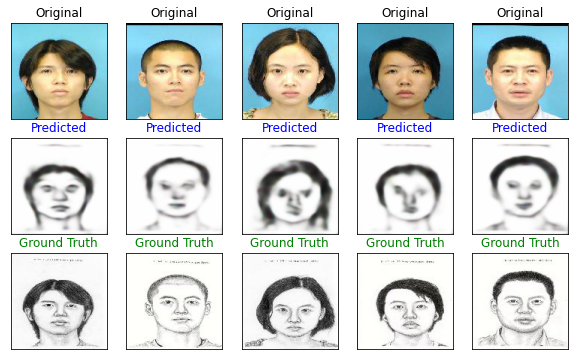

5/5 [==============================] - 58s 12s/step - loss: 4.0203 - reconstruction_loss: 0.3802 - kl_loss: 0.5089 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 37/150
5/5 [==============================] - ETA: 0s - loss: 4.0035 - reconstruction_loss: 0.3754 - kl_loss: 0.4736

5/5 [==============================] - 53s 11s/step - loss: 4.0014 - reconstruction_loss: 0.3754 - kl_loss: 0.4736 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 38/150
5/5 [==============================] - ETA: 0s - loss: 3.9675 - reconstruction_loss: 0.3690 - kl_loss: 0.5576

5/5 [==============================] - 52s 11s/step - loss: 3.9677 - reconstruction_loss: 0.3690 - kl_loss: 0.5576 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 39/150
5/5 [==============================] - ETA: 0s - loss: 3.9386 - reconstruction_loss: 0.3655 - kl_loss: 0.5257

5/5 [==============================] - 51s 11s/step - loss: 3.9352 - reconstruction_loss: 0.3655 - kl_loss: 0.5257 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 40/150
5/5 [==============================] - ETA: 0s - loss: 3.8997 - reconstruction_loss: 0.3612 - kl_loss: 0.5336

5/5 [==============================] - 53s 11s/step - loss: 3.8962 - reconstruction_loss: 0.3612 - kl_loss: 0.5336 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 41/150
1/1 [==============================] - 0s 155ms/step


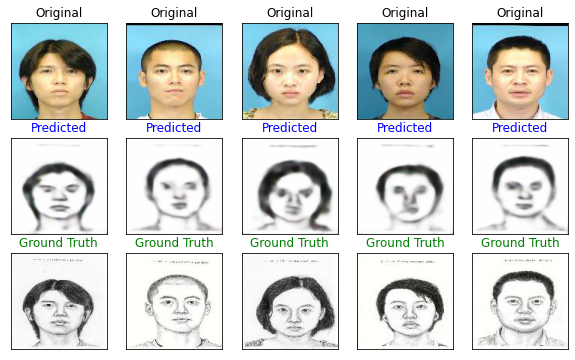

5/5 [==============================] - 54s 11s/step - loss: 3.8896 - reconstruction_loss: 0.3580 - kl_loss: 0.5778 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 42/150
5/5 [==============================] - ETA: 0s - loss: 3.8679 - reconstruction_loss: 0.3567 - kl_loss: 0.5436

5/5 [==============================] - 52s 11s/step - loss: 3.8631 - reconstruction_loss: 0.3567 - kl_loss: 0.5436 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 43/150
5/5 [==============================] - ETA: 0s - loss: 3.8531 - reconstruction_loss: 0.3515 - kl_loss: 0.5415

5/5 [==============================] - 51s 11s/step - loss: 3.8418 - reconstruction_loss: 0.3515 - kl_loss: 0.5415 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 44/150
5/5 [==============================] - ETA: 0s - loss: 3.7872 - reconstruction_loss: 0.3488 - kl_loss: 0.5990

5/5 [==============================] - 53s 10s/step - loss: 3.7873 - reconstruction_loss: 0.3488 - kl_loss: 0.5990 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 45/150
5/5 [==============================] - ETA: 0s - loss: 3.7576 - reconstruction_loss: 0.3501 - kl_loss: 0.5579

5/5 [==============================] - 51s 11s/step - loss: 3.7612 - reconstruction_loss: 0.3501 - kl_loss: 0.5579 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 46/150
1/1 [==============================] - 0s 167ms/step


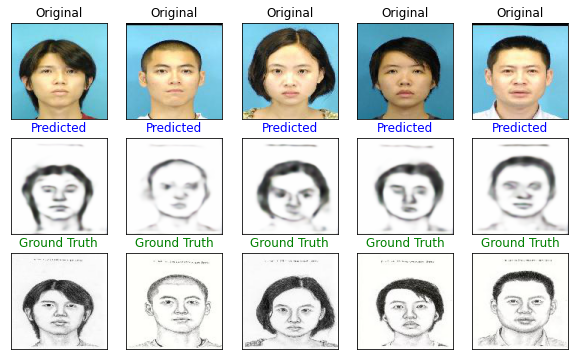

5/5 [==============================] - 53s 11s/step - loss: 3.8019 - reconstruction_loss: 0.3454 - kl_loss: 0.6046 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 47/150
5/5 [==============================] - ETA: 0s - loss: 3.7033 - reconstruction_loss: 0.3451 - kl_loss: 0.6194

5/5 [==============================] - 58s 12s/step - loss: 3.7129 - reconstruction_loss: 0.3451 - kl_loss: 0.6194 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 48/150
5/5 [==============================] - ETA: 0s - loss: 3.7179 - reconstruction_loss: 0.3436 - kl_loss: 0.5998

5/5 [==============================] - 53s 11s/step - loss: 3.7209 - reconstruction_loss: 0.3436 - kl_loss: 0.5998 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 49/150
5/5 [==============================] - ETA: 0s - loss: 3.6959 - reconstruction_loss: 0.3402 - kl_loss: 0.5971

5/5 [==============================] - 50s 11s/step - loss: 3.6966 - reconstruction_loss: 0.3402 - kl_loss: 0.5971 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 50/150
5/5 [==============================] - ETA: 0s - loss: 3.7175 - reconstruction_loss: 0.3362 - kl_loss: 0.6114

5/5 [==============================] - 51s 10s/step - loss: 3.7092 - reconstruction_loss: 0.3362 - kl_loss: 0.6114 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 51/150
1/1 [==============================] - 0s 180ms/step


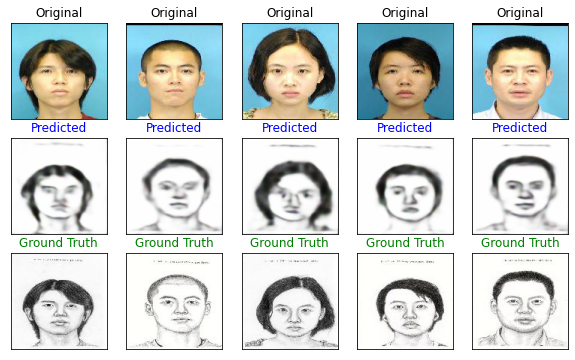

5/5 [==============================] - 54s 11s/step - loss: 3.6446 - reconstruction_loss: 0.3347 - kl_loss: 0.6017 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 52/150
5/5 [==============================] - ETA: 0s - loss: 3.6352 - reconstruction_loss: 0.3287 - kl_loss: 0.6366

5/5 [==============================] - 51s 11s/step - loss: 3.6302 - reconstruction_loss: 0.3287 - kl_loss: 0.6366 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 53/150
5/5 [==============================] - ETA: 0s - loss: 3.6708 - reconstruction_loss: 0.3308 - kl_loss: 0.6242

5/5 [==============================] - 51s 10s/step - loss: 3.6623 - reconstruction_loss: 0.3308 - kl_loss: 0.6242 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 54/150
5/5 [==============================] - ETA: 0s - loss: 3.5807 - reconstruction_loss: 0.3264 - kl_loss: 0.6496

5/5 [==============================] - 50s 11s/step - loss: 3.5820 - reconstruction_loss: 0.3264 - kl_loss: 0.6496 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 55/150
5/5 [==============================] - ETA: 0s - loss: 3.5636 - reconstruction_loss: 0.3244 - kl_loss: 0.6412

5/5 [==============================] - 55s 12s/step - loss: 3.5638 - reconstruction_loss: 0.3244 - kl_loss: 0.6412 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 56/150
1/1 [==============================] - 0s 185ms/step


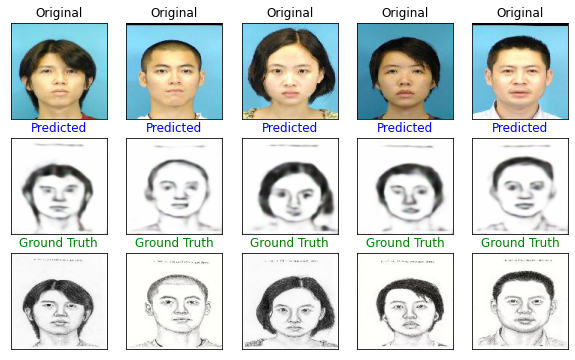

5/5 [==============================] - 53s 11s/step - loss: 3.6059 - reconstruction_loss: 0.3255 - kl_loss: 0.6490 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 57/150
5/5 [==============================] - ETA: 0s - loss: 3.4683 - reconstruction_loss: 0.3175 - kl_loss: 0.6714

5/5 [==============================] - 51s 11s/step - loss: 3.4753 - reconstruction_loss: 0.3175 - kl_loss: 0.6714 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 58/150
5/5 [==============================] - ETA: 0s - loss: 3.4635 - reconstruction_loss: 0.3169 - kl_loss: 0.6240

5/5 [==============================] - 52s 11s/step - loss: 3.4664 - reconstruction_loss: 0.3169 - kl_loss: 0.6240 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 59/150
5/5 [==============================] - ETA: 0s - loss: 3.5103 - reconstruction_loss: 0.3176 - kl_loss: 0.6673 

5/5 [==============================] - 59s 12s/step - loss: 3.5102 - reconstruction_loss: 0.3176 - kl_loss: 0.6673 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 60/150
5/5 [==============================] - ETA: 0s - loss: 3.4619 - reconstruction_loss: 0.3126 - kl_loss: 0.6928

5/5 [==============================] - 52s 10s/step - loss: 3.4635 - reconstruction_loss: 0.3126 - kl_loss: 0.6928 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 61/150
1/1 [==============================] - 0s 163ms/step


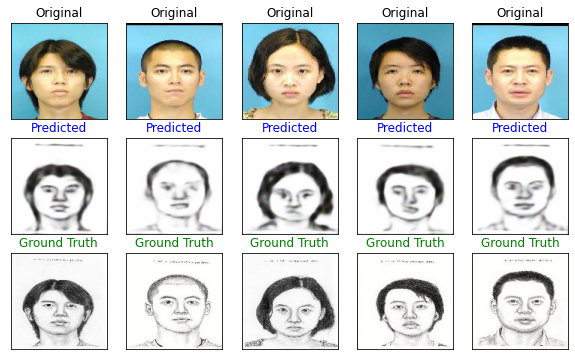

5/5 [==============================] - 53s 11s/step - loss: 3.4430 - reconstruction_loss: 0.3115 - kl_loss: 0.6563 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 62/150
5/5 [==============================] - ETA: 0s - loss: 3.4211 - reconstruction_loss: 0.3072 - kl_loss: 0.7175

5/5 [==============================] - 52s 11s/step - loss: 3.4227 - reconstruction_loss: 0.3072 - kl_loss: 0.7175 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 63/150
5/5 [==============================] - ETA: 0s - loss: 3.3955 - reconstruction_loss: 0.3099 - kl_loss: 0.6365

5/5 [==============================] - 52s 11s/step - loss: 3.3991 - reconstruction_loss: 0.3099 - kl_loss: 0.6365 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 64/150
5/5 [==============================] - ETA: 0s - loss: 3.4039 - reconstruction_loss: 0.3071 - kl_loss: 0.7041

5/5 [==============================] - 52s 11s/step - loss: 3.4070 - reconstruction_loss: 0.3071 - kl_loss: 0.7041 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 65/150
5/5 [==============================] - ETA: 0s - loss: 3.4002 - reconstruction_loss: 0.3054 - kl_loss: 0.6697

5/5 [==============================] - 50s 10s/step - loss: 3.3982 - reconstruction_loss: 0.3054 - kl_loss: 0.6697 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 66/150
1/1 [==============================] - 0s 168ms/step


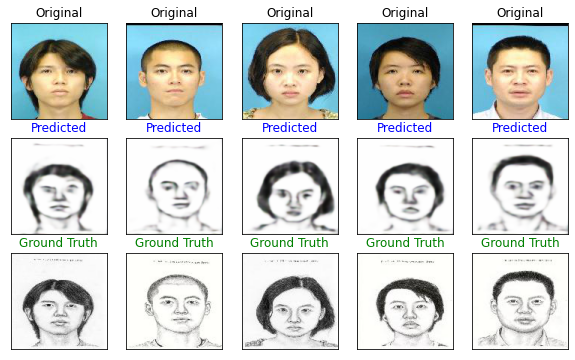

5/5 [==============================] - 58s 12s/step - loss: 3.4336 - reconstruction_loss: 0.3072 - kl_loss: 0.6917 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 67/150
5/5 [==============================] - ETA: 0s - loss: 3.3814 - reconstruction_loss: 0.3026 - kl_loss: 0.7062

5/5 [==============================] - 50s 10s/step - loss: 3.3810 - reconstruction_loss: 0.3026 - kl_loss: 0.7062 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 68/150
5/5 [==============================] - ETA: 0s - loss: 3.3453 - reconstruction_loss: 0.2995 - kl_loss: 0.7194

5/5 [==============================] - 50s 10s/step - loss: 3.3469 - reconstruction_loss: 0.2995 - kl_loss: 0.7194 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 69/150
5/5 [==============================] - ETA: 0s - loss: 3.3279 - reconstruction_loss: 0.2974 - kl_loss: 0.6978

5/5 [==============================] - 52s 11s/step - loss: 3.3271 - reconstruction_loss: 0.2974 - kl_loss: 0.6978 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 70/150
5/5 [==============================] - ETA: 0s - loss: 3.3134 - reconstruction_loss: 0.2969 - kl_loss: 0.6864

5/5 [==============================] - 51s 10s/step - loss: 3.3132 - reconstruction_loss: 0.2969 - kl_loss: 0.6864 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 71/150
1/1 [==============================] - 0s 171ms/step


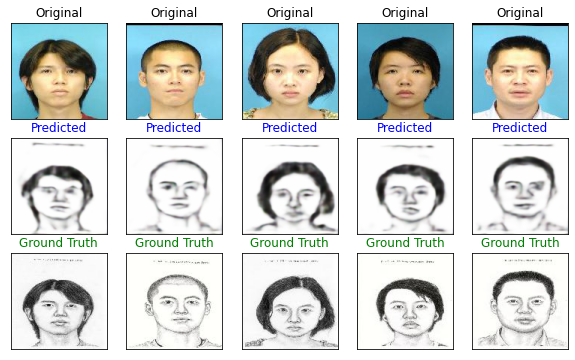

5/5 [==============================] - 60s 11s/step - loss: 3.2920 - reconstruction_loss: 0.2929 - kl_loss: 0.7329 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 72/150
5/5 [==============================] - ETA: 0s - loss: 3.3113 - reconstruction_loss: 0.2945 - kl_loss: 0.7269

5/5 [==============================] - 49s 10s/step - loss: 3.3109 - reconstruction_loss: 0.2945 - kl_loss: 0.7269 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 73/150
5/5 [==============================] - ETA: 0s - loss: 3.2704 - reconstruction_loss: 0.2924 - kl_loss: 0.6875

5/5 [==============================] - 54s 10s/step - loss: 3.2700 - reconstruction_loss: 0.2924 - kl_loss: 0.6875 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 74/150
5/5 [==============================] - ETA: 0s - loss: 3.2695 - reconstruction_loss: 0.2916 - kl_loss: 0.7175

5/5 [==============================] - 49s 10s/step - loss: 3.2704 - reconstruction_loss: 0.2916 - kl_loss: 0.7175 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 75/150
5/5 [==============================] - ETA: 0s - loss: 3.2176 - reconstruction_loss: 0.2878 - kl_loss: 0.7263

5/5 [==============================] - 51s 10s/step - loss: 3.2215 - reconstruction_loss: 0.2878 - kl_loss: 0.7263 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 76/150
1/1 [==============================] - 0s 175ms/step


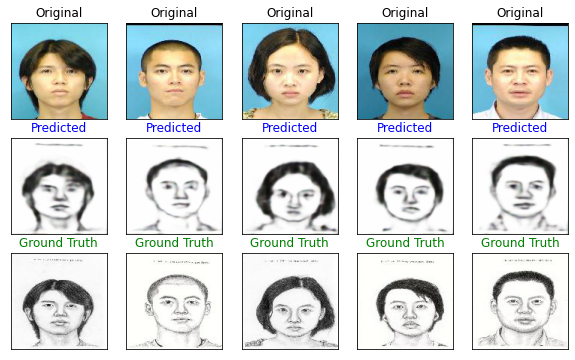

5/5 [==============================] - 55s 11s/step - loss: 3.2363 - reconstruction_loss: 0.2878 - kl_loss: 0.7065 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 77/150
5/5 [==============================] - ETA: 0s - loss: 3.2084 - reconstruction_loss: 0.2850 - kl_loss: 0.7076

5/5 [==============================] - 50s 11s/step - loss: 3.2076 - reconstruction_loss: 0.2850 - kl_loss: 0.7076 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 78/150
5/5 [==============================] - ETA: 0s - loss: 3.1906 - reconstruction_loss: 0.2840 - kl_loss: 0.7173

5/5 [==============================] - 52s 11s/step - loss: 3.1920 - reconstruction_loss: 0.2840 - kl_loss: 0.7173 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 79/150
5/5 [==============================] - ETA: 0s - loss: 3.1628 - reconstruction_loss: 0.2811 - kl_loss: 0.7277

5/5 [==============================] - 52s 11s/step - loss: 3.1648 - reconstruction_loss: 0.2811 - kl_loss: 0.7277 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 80/150
5/5 [==============================] - ETA: 0s - loss: 3.1780 - reconstruction_loss: 0.2811 - kl_loss: 0.6913

5/5 [==============================] - 54s 11s/step - loss: 3.1745 - reconstruction_loss: 0.2811 - kl_loss: 0.6913 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 81/150
1/1 [==============================] - 0s 181ms/step


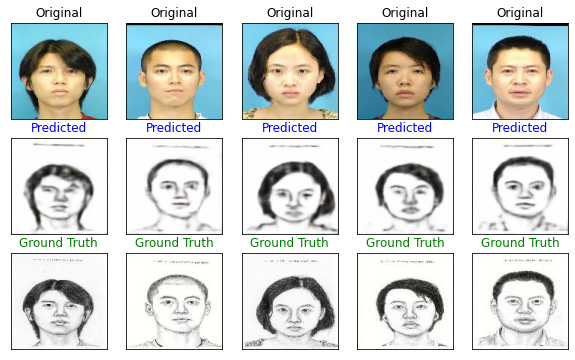

5/5 [==============================] - 53s 11s/step - loss: 3.1089 - reconstruction_loss: 0.2785 - kl_loss: 0.7197 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 82/150
5/5 [==============================] - ETA: 0s - loss: 3.1868 - reconstruction_loss: 0.2801 - kl_loss: 0.7353

5/5 [==============================] - 59s 12s/step - loss: 3.1839 - reconstruction_loss: 0.2801 - kl_loss: 0.7353 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 83/150
5/5 [==============================] - ETA: 0s - loss: 3.1635 - reconstruction_loss: 0.2784 - kl_loss: 0.7291

5/5 [==============================] - 54s 11s/step - loss: 3.1611 - reconstruction_loss: 0.2784 - kl_loss: 0.7291 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 84/150
5/5 [==============================] - ETA: 0s - loss: 3.1917 - reconstruction_loss: 0.2810 - kl_loss: 0.7338

5/5 [==============================] - 51s 10s/step - loss: 3.1892 - reconstruction_loss: 0.2810 - kl_loss: 0.7338 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 85/150
5/5 [==============================] - ETA: 0s - loss: 3.1409 - reconstruction_loss: 0.2764 - kl_loss: 0.7493

5/5 [==============================] - 51s 11s/step - loss: 3.1405 - reconstruction_loss: 0.2764 - kl_loss: 0.7493 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 86/150
1/1 [==============================] - 0s 174ms/step


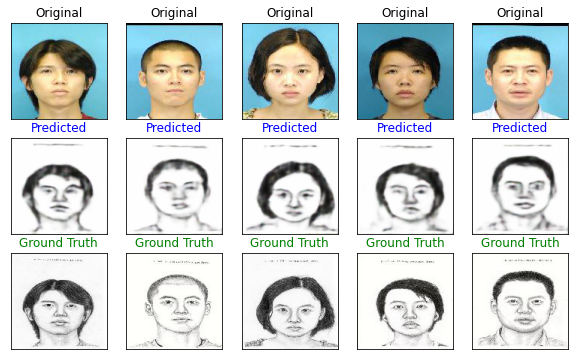

5/5 [==============================] - 54s 11s/step - loss: 3.1062 - reconstruction_loss: 0.2755 - kl_loss: 0.7214 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 87/150
5/5 [==============================] - ETA: 0s - loss: 3.0791 - reconstruction_loss: 0.2724 - kl_loss: 0.7366

5/5 [==============================] - 52s 11s/step - loss: 3.0812 - reconstruction_loss: 0.2724 - kl_loss: 0.7366 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 88/150
5/5 [==============================] - ETA: 0s - loss: 3.1000 - reconstruction_loss: 0.2729 - kl_loss: 0.7276

5/5 [==============================] - 50s 10s/step - loss: 3.0987 - reconstruction_loss: 0.2729 - kl_loss: 0.7276 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 89/150
5/5 [==============================] - ETA: 0s - loss: 3.0706 - reconstruction_loss: 0.2712 - kl_loss: 0.7348

5/5 [==============================] - 51s 10s/step - loss: 3.0721 - reconstruction_loss: 0.2712 - kl_loss: 0.7348 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 90/150
5/5 [==============================] - ETA: 0s - loss: 3.0415 - reconstruction_loss: 0.2690 - kl_loss: 0.7666

5/5 [==============================] - 52s 11s/step - loss: 3.0469 - reconstruction_loss: 0.2690 - kl_loss: 0.7666 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 91/150
1/1 [==============================] - 0s 156ms/step


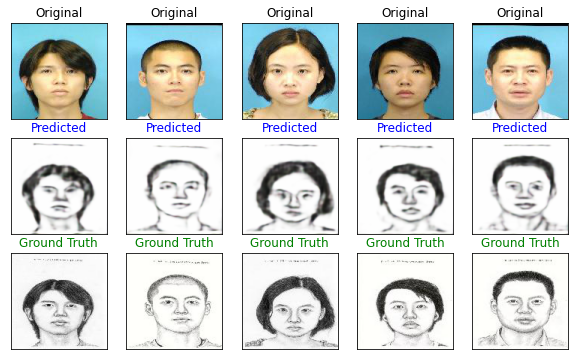

5/5 [==============================] - 50s 11s/step - loss: 3.0504 - reconstruction_loss: 0.2691 - kl_loss: 0.7575 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 92/150
5/5 [==============================] - ETA: 0s - loss: 3.0471 - reconstruction_loss: 0.2686 - kl_loss: 0.7365

5/5 [==============================] - 51s 10s/step - loss: 3.0483 - reconstruction_loss: 0.2686 - kl_loss: 0.7365 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 93/150
5/5 [==============================] - ETA: 0s - loss: 3.0027 - reconstruction_loss: 0.2644 - kl_loss: 0.7490

5/5 [==============================] - 50s 10s/step - loss: 3.0054 - reconstruction_loss: 0.2644 - kl_loss: 0.7490 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 94/150
5/5 [==============================] - ETA: 0s - loss: 3.0026 - reconstruction_loss: 0.2659 - kl_loss: 0.7362 

5/5 [==============================] - 59s 12s/step - loss: 3.0067 - reconstruction_loss: 0.2659 - kl_loss: 0.7362 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 95/150
5/5 [==============================] - ETA: 0s - loss: 3.0135 - reconstruction_loss: 0.2660 - kl_loss: 0.7334

5/5 [==============================] - 53s 11s/step - loss: 3.0157 - reconstruction_loss: 0.2660 - kl_loss: 0.7334 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 96/150
1/1 [==============================] - 0s 178ms/step


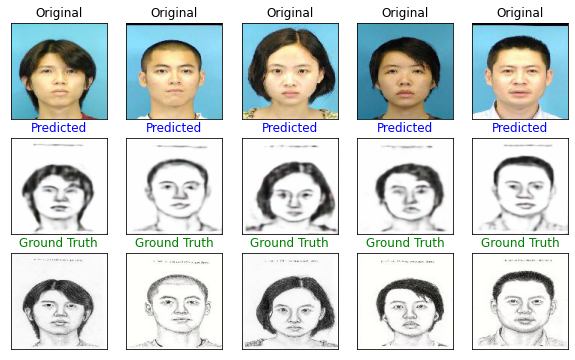

5/5 [==============================] - 51s 10s/step - loss: 3.0355 - reconstruction_loss: 0.2646 - kl_loss: 0.7449 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 97/150
5/5 [==============================] - ETA: 0s - loss: 2.9864 - reconstruction_loss: 0.2634 - kl_loss: 0.7539

5/5 [==============================] - 52s 10s/step - loss: 2.9904 - reconstruction_loss: 0.2634 - kl_loss: 0.7539 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 98/150
5/5 [==============================] - ETA: 0s - loss: 2.9736 - reconstruction_loss: 0.2610 - kl_loss: 0.7326

5/5 [==============================] - 51s 11s/step - loss: 2.9740 - reconstruction_loss: 0.2610 - kl_loss: 0.7326 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 99/150
5/5 [==============================] - ETA: 0s - loss: 2.9634 - reconstruction_loss: 0.2611 - kl_loss: 0.7446

5/5 [==============================] - 52s 11s/step - loss: 2.9667 - reconstruction_loss: 0.2611 - kl_loss: 0.7446 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 100/150
5/5 [==============================] - ETA: 0s - loss: 2.9376 - reconstruction_loss: 0.2605 - kl_loss: 0.7632

5/5 [==============================] - 51s 11s/step - loss: 2.9458 - reconstruction_loss: 0.2605 - kl_loss: 0.7632 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 101/150
1/1 [==============================] - 0s 168ms/step


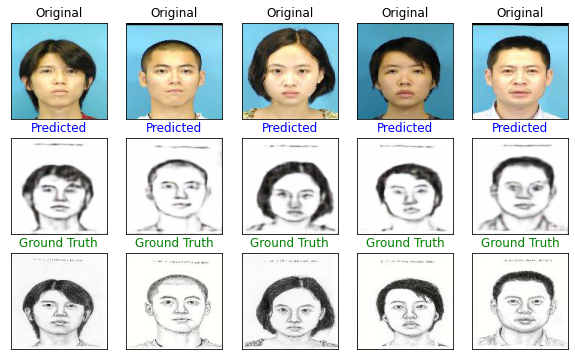

5/5 [==============================] - 52s 11s/step - loss: 2.9924 - reconstruction_loss: 0.2618 - kl_loss: 0.7365 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 102/150
5/5 [==============================] - ETA: 0s - loss: 2.9479 - reconstruction_loss: 0.2593 - kl_loss: 0.7789

5/5 [==============================] - 49s 10s/step - loss: 2.9537 - reconstruction_loss: 0.2593 - kl_loss: 0.7789 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 103/150
5/5 [==============================] - ETA: 0s - loss: 2.9544 - reconstruction_loss: 0.2558 - kl_loss: 0.7707

5/5 [==============================] - 51s 11s/step - loss: 2.9526 - reconstruction_loss: 0.2558 - kl_loss: 0.7707 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 104/150
5/5 [==============================] - ETA: 0s - loss: 2.9440 - reconstruction_loss: 0.2567 - kl_loss: 0.7387

5/5 [==============================] - 50s 10s/step - loss: 2.9427 - reconstruction_loss: 0.2567 - kl_loss: 0.7387 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 105/150
5/5 [==============================] - ETA: 0s - loss: 2.9086 - reconstruction_loss: 0.2526 - kl_loss: 0.7363

5/5 [==============================] - 51s 11s/step - loss: 2.9063 - reconstruction_loss: 0.2526 - kl_loss: 0.7363 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 106/150
1/1 [==============================] - 0s 168ms/step


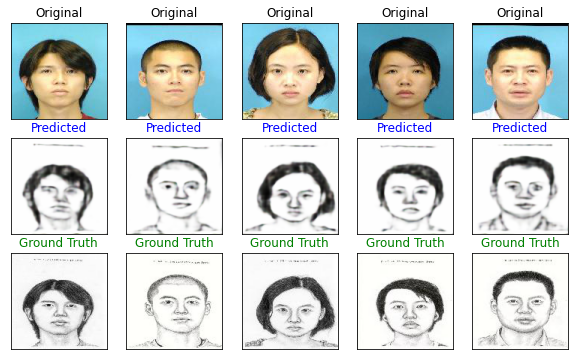

5/5 [==============================] - 59s 13s/step - loss: 2.9434 - reconstruction_loss: 0.2565 - kl_loss: 0.7463 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 107/150
5/5 [==============================] - ETA: 0s - loss: 2.9426 - reconstruction_loss: 0.2520 - kl_loss: 0.8150

5/5 [==============================] - 53s 11s/step - loss: 2.9401 - reconstruction_loss: 0.2520 - kl_loss: 0.8150 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 108/150
5/5 [==============================] - ETA: 0s - loss: 2.9298 - reconstruction_loss: 0.2567 - kl_loss: 0.6883

5/5 [==============================] - 50s 10s/step - loss: 2.9268 - reconstruction_loss: 0.2567 - kl_loss: 0.6883 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 109/150
5/5 [==============================] - ETA: 0s - loss: 2.9117 - reconstruction_loss: 0.2520 - kl_loss: 0.7827

5/5 [==============================] - 51s 11s/step - loss: 2.9116 - reconstruction_loss: 0.2520 - kl_loss: 0.7827 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 110/150
5/5 [==============================] - ETA: 0s - loss: 2.8810 - reconstruction_loss: 0.2525 - kl_loss: 0.7407

5/5 [==============================] - 52s 11s/step - loss: 2.8834 - reconstruction_loss: 0.2525 - kl_loss: 0.7407 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 111/150
1/1 [==============================] - 0s 167ms/step


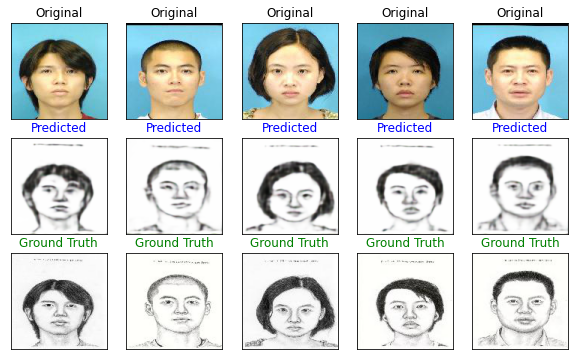

5/5 [==============================] - 51s 11s/step - loss: 2.9380 - reconstruction_loss: 0.2525 - kl_loss: 0.7497 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 112/150
5/5 [==============================] - ETA: 0s - loss: 2.8692 - reconstruction_loss: 0.2502 - kl_loss: 0.7436

5/5 [==============================] - 50s 10s/step - loss: 2.8699 - reconstruction_loss: 0.2502 - kl_loss: 0.7436 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 113/150
5/5 [==============================] - ETA: 0s - loss: 2.8419 - reconstruction_loss: 0.2478 - kl_loss: 0.7555

5/5 [==============================] - 53s 11s/step - loss: 2.8442 - reconstruction_loss: 0.2478 - kl_loss: 0.7555 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 114/150
5/5 [==============================] - ETA: 0s - loss: 2.8470 - reconstruction_loss: 0.2474 - kl_loss: 0.7521

5/5 [==============================] - 52s 10s/step - loss: 2.8476 - reconstruction_loss: 0.2474 - kl_loss: 0.7521 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 115/150
5/5 [==============================] - ETA: 0s - loss: 2.7951 - reconstruction_loss: 0.2451 - kl_loss: 0.7381

5/5 [==============================] - 51s 10s/step - loss: 2.7993 - reconstruction_loss: 0.2451 - kl_loss: 0.7381 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 116/150
1/1 [==============================] - 0s 161ms/step


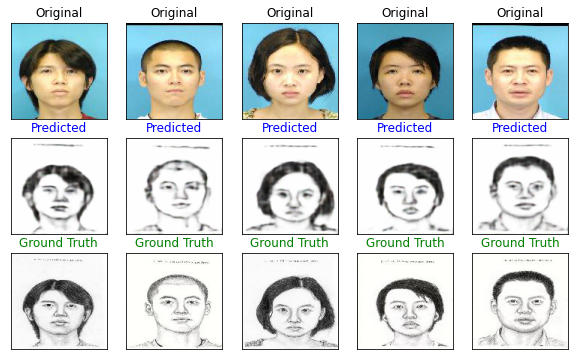

5/5 [==============================] - 51s 11s/step - loss: 2.8261 - reconstruction_loss: 0.2461 - kl_loss: 0.7508 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 117/150
5/5 [==============================] - ETA: 0s - loss: 2.8509 - reconstruction_loss: 0.2485 - kl_loss: 0.7599

5/5 [==============================] - 57s 12s/step - loss: 2.8532 - reconstruction_loss: 0.2485 - kl_loss: 0.7599 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 118/150
5/5 [==============================] - ETA: 0s - loss: 2.8829 - reconstruction_loss: 0.2457 - kl_loss: 0.7986

5/5 [==============================] - 50s 10s/step - loss: 2.8785 - reconstruction_loss: 0.2457 - kl_loss: 0.7986 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 119/150
5/5 [==============================] - ETA: 0s - loss: 2.8134 - reconstruction_loss: 0.2449 - kl_loss: 0.7664

5/5 [==============================] - 50s 11s/step - loss: 2.8166 - reconstruction_loss: 0.2449 - kl_loss: 0.7664 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 120/150
5/5 [==============================] - ETA: 0s - loss: 2.7814 - reconstruction_loss: 0.2445 - kl_loss: 0.7390

5/5 [==============================] - 51s 10s/step - loss: 2.7870 - reconstruction_loss: 0.2445 - kl_loss: 0.7390 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 121/150
1/1 [==============================] - 0s 153ms/step


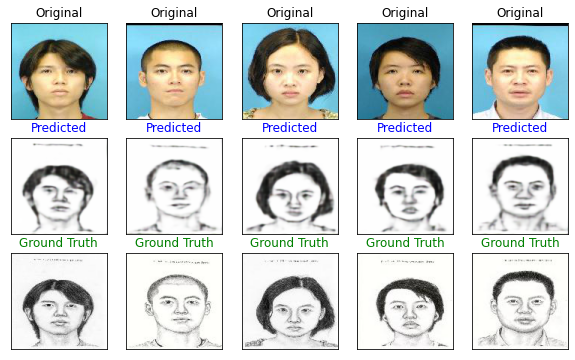

5/5 [==============================] - 50s 11s/step - loss: 2.8182 - reconstruction_loss: 0.2420 - kl_loss: 0.7690 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 122/150
5/5 [==============================] - ETA: 0s - loss: 2.8453 - reconstruction_loss: 0.2477 - kl_loss: 0.7160

5/5 [==============================] - 50s 10s/step - loss: 2.8436 - reconstruction_loss: 0.2477 - kl_loss: 0.7160 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 123/150
5/5 [==============================] - ETA: 0s - loss: 2.7953 - reconstruction_loss: 0.2422 - kl_loss: 0.7889

5/5 [==============================] - 50s 10s/step - loss: 2.7988 - reconstruction_loss: 0.2422 - kl_loss: 0.7889 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 124/150
5/5 [==============================] - ETA: 0s - loss: 2.7743 - reconstruction_loss: 0.2435 - kl_loss: 0.7715

5/5 [==============================] - 53s 11s/step - loss: 2.7821 - reconstruction_loss: 0.2435 - kl_loss: 0.7715 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 125/150
5/5 [==============================] - ETA: 0s - loss: 2.7969 - reconstruction_loss: 0.2424 - kl_loss: 0.7493

5/5 [==============================] - 49s 10s/step - loss: 2.7973 - reconstruction_loss: 0.2424 - kl_loss: 0.7493 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 126/150
1/1 [==============================] - 0s 155ms/step


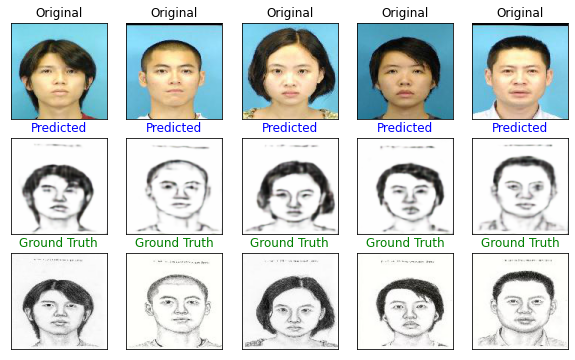

5/5 [==============================] - 52s 11s/step - loss: 2.7794 - reconstruction_loss: 0.2392 - kl_loss: 0.7821 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 127/150
5/5 [==============================] - ETA: 0s - loss: 2.7414 - reconstruction_loss: 0.2403 - kl_loss: 0.7555

5/5 [==============================] - 52s 11s/step - loss: 2.7480 - reconstruction_loss: 0.2403 - kl_loss: 0.7555 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 128/150
5/5 [==============================] - ETA: 0s - loss: 2.7834 - reconstruction_loss: 0.2413 - kl_loss: 0.7623

5/5 [==============================] - 51s 10s/step - loss: 2.7852 - reconstruction_loss: 0.2413 - kl_loss: 0.7623 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 129/150
5/5 [==============================] - ETA: 0s - loss: 2.7402 - reconstruction_loss: 0.2394 - kl_loss: 0.7492

5/5 [==============================] - 55s 12s/step - loss: 2.7449 - reconstruction_loss: 0.2394 - kl_loss: 0.7492 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 130/150
5/5 [==============================] - ETA: 0s - loss: 2.7677 - reconstruction_loss: 0.2375 - kl_loss: 0.7704

5/5 [==============================] - 51s 10s/step - loss: 2.7665 - reconstruction_loss: 0.2375 - kl_loss: 0.7704 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 131/150
1/1 [==============================] - 0s 159ms/step


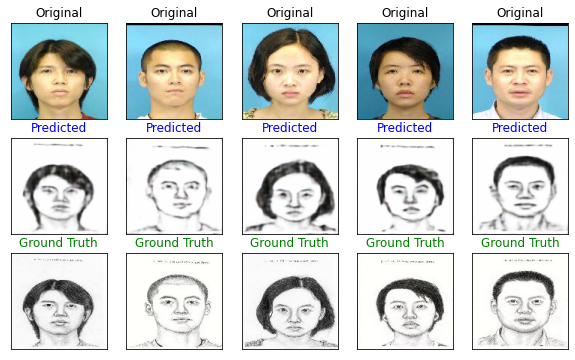

5/5 [==============================] - 55s 11s/step - loss: 2.7366 - reconstruction_loss: 0.2391 - kl_loss: 0.7458 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 132/150
5/5 [==============================] - ETA: 0s - loss: 2.7403 - reconstruction_loss: 0.2357 - kl_loss: 0.7804

5/5 [==============================] - 51s 11s/step - loss: 2.7414 - reconstruction_loss: 0.2357 - kl_loss: 0.7804 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 133/150
5/5 [==============================] - ETA: 0s - loss: 2.7321 - reconstruction_loss: 0.2381 - kl_loss: 0.7276

5/5 [==============================] - 51s 10s/step - loss: 2.7342 - reconstruction_loss: 0.2381 - kl_loss: 0.7276 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 134/150
5/5 [==============================] - ETA: 0s - loss: 2.7358 - reconstruction_loss: 0.2358 - kl_loss: 0.7709

5/5 [==============================] - 50s 11s/step - loss: 2.7371 - reconstruction_loss: 0.2358 - kl_loss: 0.7709 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 135/150
5/5 [==============================] - ETA: 0s - loss: 2.7507 - reconstruction_loss: 0.2344 - kl_loss: 0.7602

5/5 [==============================] - 52s 11s/step - loss: 2.7463 - reconstruction_loss: 0.2344 - kl_loss: 0.7602 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 136/150
1/1 [==============================] - 0s 170ms/step


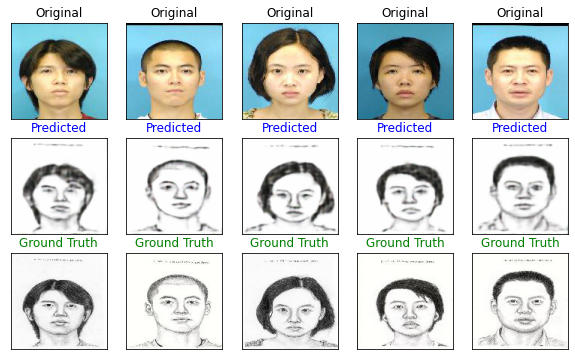

5/5 [==============================] - 52s 11s/step - loss: 2.7232 - reconstruction_loss: 0.2354 - kl_loss: 0.7478 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 137/150
5/5 [==============================] - ETA: 0s - loss: 2.7234 - reconstruction_loss: 0.2369 - kl_loss: 0.7558

5/5 [==============================] - 52s 11s/step - loss: 2.7273 - reconstruction_loss: 0.2369 - kl_loss: 0.7558 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 138/150
5/5 [==============================] - ETA: 0s - loss: 2.7048 - reconstruction_loss: 0.2343 - kl_loss: 0.7809

5/5 [==============================] - 52s 11s/step - loss: 2.7096 - reconstruction_loss: 0.2343 - kl_loss: 0.7809 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 139/150
5/5 [==============================] - ETA: 0s - loss: 2.7136 - reconstruction_loss: 0.2342 - kl_loss: 0.7747

5/5 [==============================] - 50s 11s/step - loss: 2.7163 - reconstruction_loss: 0.2342 - kl_loss: 0.7747 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 140/150
5/5 [==============================] - ETA: 0s - loss: 2.7414 - reconstruction_loss: 0.2338 - kl_loss: 0.7702

5/5 [==============================] - 52s 10s/step - loss: 2.7383 - reconstruction_loss: 0.2338 - kl_loss: 0.7702 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 141/150
1/1 [==============================] - 0s 296ms/step


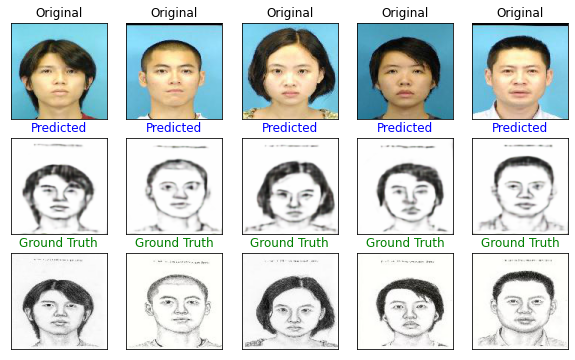

5/5 [==============================] - 61s 12s/step - loss: 2.7199 - reconstruction_loss: 0.2315 - kl_loss: 0.7564 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 142/150
5/5 [==============================] - ETA: 0s - loss: 2.7287 - reconstruction_loss: 0.2324 - kl_loss: 0.7514

5/5 [==============================] - 51s 10s/step - loss: 2.7239 - reconstruction_loss: 0.2324 - kl_loss: 0.7514 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 143/150
5/5 [==============================] - ETA: 0s - loss: 2.7222 - reconstruction_loss: 0.2326 - kl_loss: 0.7538

5/5 [==============================] - 49s 10s/step - loss: 2.7190 - reconstruction_loss: 0.2326 - kl_loss: 0.7538 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 144/150
5/5 [==============================] - ETA: 0s - loss: 2.7196 - reconstruction_loss: 0.2314 - kl_loss: 0.7671

5/5 [==============================] - 52s 11s/step - loss: 2.7160 - reconstruction_loss: 0.2314 - kl_loss: 0.7671 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 145/150
5/5 [==============================] - ETA: 0s - loss: 2.6904 - reconstruction_loss: 0.2326 - kl_loss: 0.7558

5/5 [==============================] - 51s 11s/step - loss: 2.6927 - reconstruction_loss: 0.2326 - kl_loss: 0.7558 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 146/150
1/1 [==============================] - 0s 160ms/step


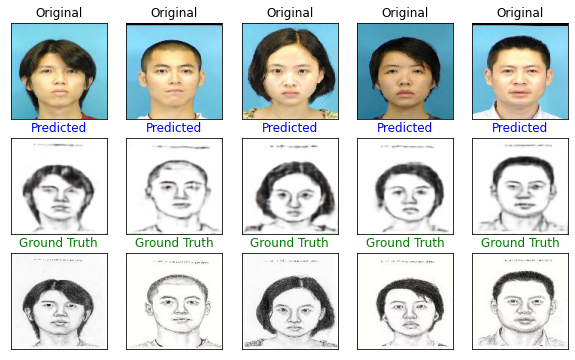

5/5 [==============================] - 51s 11s/step - loss: 2.6954 - reconstruction_loss: 0.2287 - kl_loss: 0.7855 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 147/150
5/5 [==============================] - ETA: 0s - loss: 2.6680 - reconstruction_loss: 0.2310 - kl_loss: 0.7520 

5/5 [==============================] - 57s 12s/step - loss: 2.6710 - reconstruction_loss: 0.2310 - kl_loss: 0.7520 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 148/150
5/5 [==============================] - ETA: 0s - loss: 2.6581 - reconstruction_loss: 0.2281 - kl_loss: 0.7732

5/5 [==============================] - 52s 11s/step - loss: 2.6596 - reconstruction_loss: 0.2281 - kl_loss: 0.7732 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 149/150
5/5 [==============================] - ETA: 0s - loss: 2.6515 - reconstruction_loss: 0.2295 - kl_loss: 0.7649

5/5 [==============================] - 49s 10s/step - loss: 2.6558 - reconstruction_loss: 0.2295 - kl_loss: 0.7649 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00
Epoch 150/150
5/5 [==============================] - ETA: 0s - loss: 2.6438 - reconstruction_loss: 0.2294 - kl_loss: 0.7740

5/5 [==============================] - 55s 11s/step - loss: 2.6499 - reconstruction_loss: 0.2294 - kl_loss: 0.7740 - val_total_loss: 0.0000e+00 - val_reconstruction_loss: 0.0000e+00 - val_kl_loss: 0.0000e+00


Text(0.5, 1.0, 'Loss over the epochs')

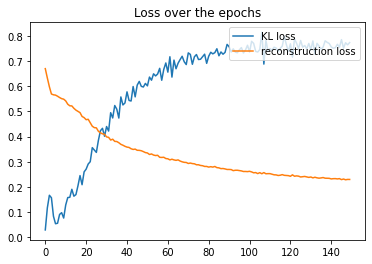

time: 2h 12min 36s (started: 2023-03-09 20:57:46 +00:00)


In [9]:
# def ssim_loss(ytrue,ypred):
#   return tf.reduce_mean(1-tf.image.ssim(ytrue,ypred,max_val=1.0))

vae2 , start_at = get_autoencoder(), 0
# vae2, start_at = keras.models.load_model(f'{MODELS_PATH}vae_ssim_chpt'), 45

vae2.compile(kl_loss_factor=0.5, rec_loss_factor=10,
    optimizer=Adam(0.001, amsgrad=True, clipnorm=1e-3),
    loss=base_models.SSIMLoss()
)

hist2 = vae2.fit(
    cuhk_photo_train, cuhk_sketch_train,
    epochs=150, batch_size=32, initial_epoch=start_at,
    shuffle=True, validation_split=0.1,
    callbacks=[
        ModelVizCallback(vae2, cuhk_photo_train, cuhk_sketch_train, 
                         TARGET_SIZE, freq=5),
        keras.callbacks.ModelCheckpoint(
            f'{MODELS_PATH}vae_ssim_chpt', 
            monitor='reconstruction_loss',),
        ],
)

vae2.save(f'{MODELS_PATH}vae_w_ssin')


plt.plot(hist2.history["kl_loss"])
plt.plot(hist2.history["reconstruction_loss"])
plt.legend(['KL loss','reconstruction loss'], loc='upper right')
plt.title('Loss over the epochs')


In [12]:
# vae2.save(f'{MODELS_PATH}vae_w_ssim')
vae2.save_weights(f'{MODELS_PATH}vae_ssim_weights')

time: 8.33 s (started: 2023-03-09 23:11:11 +00:00)


In [ ]:
# vae2 = keras.models.load_model(f'{MODELS_PATH}vae_w_ssim')

## Model Evaluation

1/1 [==============================] - 0s 493ms/step


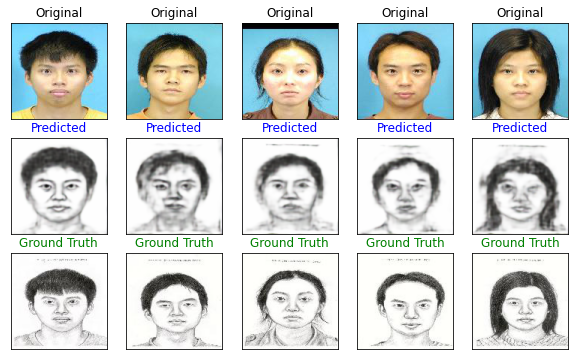

time: 1.43 s (started: 2023-03-09 23:12:05 +00:00)


In [14]:
generated_sketches = vae2.predict(cuhk_photo_test)
preparation.plot_synthesis(cuhk_photo_test, generated_sketches, cuhk_sketch_test, TARGET_SIZE)
save_images(generated_sketches, 'vae_ssim')

/usr/local/lib/python3.9/dist-packages/image_similarity_measures/quality_metrics.py:197: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return structural_similarity(org_img, pred_img, data_range=max_p, multichannel=True)


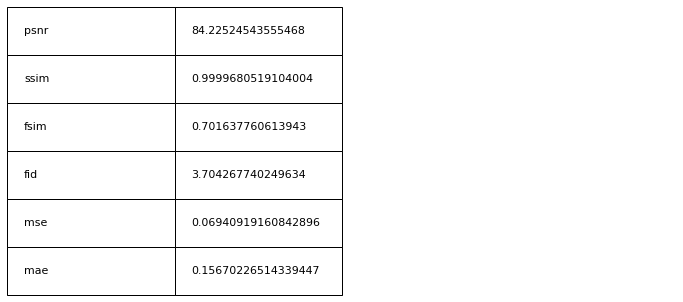

time: 7.27 s (started: 2023-03-09 23:11:49 +00:00)


In [13]:
eval2 = similarity.Evaluator()
eval2.evaluate_batch_on_all(cuhk_sketch_test,generated_sketches)
eval2.results
preparation.plot_dict_as_table(eval2.results)